# Import packages

In [139]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from pandas_profiling import ProfileReport
import missingno as msnos


# Set variables and options

In [140]:
datapath = '../../spotifAI/data/raw/'

In [141]:
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 50)
pd.set_option('max_colwidth', 60)

# Define functions

In [142]:
def remove_left_right_spaces(df, col):
    '''Remove spaces at beginning and end of string for df[col]'''
    df[col] = df[col].str.lstrip().str.rstrip()
    return df[col]


In [143]:
def ecdf(data):
    """ Compute ECDF; data can be a Pandas series """
    x = np.sort(data)
    n = x.size
    y = np.arange(1, n+1) / n
    return(x,y)

# Read data

In [144]:
chunks = pd.read_csv(datapath + 'Database to calculate popularity.csv', index_col=0, parse_dates=['date'], chunksize=1000000)
df_database = pd.concat(chunks)

In [145]:
chunks_final = pd.read_csv(datapath + 'Final database.csv', chunksize=1000000)
df_final = pd.concat(chunks_final)

/Users/karlijnschipper/opt/anaconda3/envs/spotifAI/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3343: DtypeWarning: Columns (7,8,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


# Preprocess data

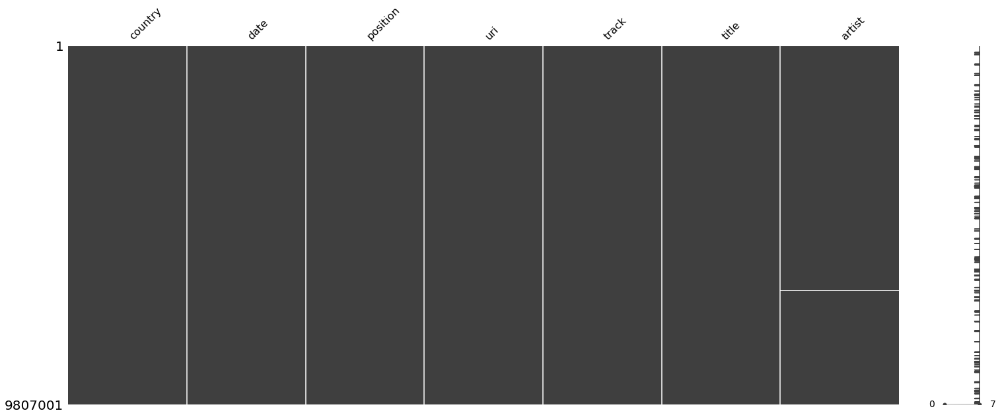

In [146]:
msnos.matrix(df_database);

In [147]:
# DATABASE
print('Shape before: ', df_database.shape)

# Make selections
df_database = df_database[df_database['country'] == 'Global']
df_database = df_database[~df_database['artist'].isna()]
df_database = df_database.drop('country', axis=1)

# Preprocess columns
for col in ["uri", "track", "title", "artist"]:
    df_database[col] = remove_left_right_spaces(df_database, col)
    df_database[col] = df_database[col].str.lower()

# Change data types
df_database['position'] = df_database['position'].astype(int)

print('Shape after: ', df_database.shape)
print('# tracks: ', df_database.track.nunique())
print('# artists: ', df_database.artist.nunique())


Shape before:  (9807001, 7)
Shape after:  (279982, 6)
# tracks:  4961
# artists:  1819


In [148]:
df_database.head()

,date,position,uri,track,title,artist
0,2020-05-11,1,https://open.spotify.com/track/47eiuvwup4c9fgccapuucs,"dakiti , bad bunny, jhay cortez",dakiti,"bad bunny, jhay cortez"
1,2020-05-11,2,https://open.spotify.com/track/35mvy5s1h3j2qzyna3tfe0,"positions , ariana grande",positions,ariana grande
2,2020-05-11,3,https://open.spotify.com/track/3tjfyv6rsftuktyl3ztycq,"mood , 24kgoldn",mood,24kgoldn
3,2020-05-11,4,https://open.spotify.com/track/7hxhwccaiixflczvdgnqhx,"lemonade , internet money",lemonade,internet money
4,2020-05-11,5,https://open.spotify.com/track/4y4spb9m0q6026kfkavy9q,"lonely , justin bieber",lonely,justin bieber


In [150]:
multiple_uris = df_database.groupby('track')['uri'].nunique().reset_index()
multiple_uris[multiple_uris['uri'] > 1] # 781


,track,uri
3,"'till i collapse , eminem, nate dogg",2
5,"...ready for it? , taylor swift",4
7,"00:00 , bts",2
9,"1-800-273-8255 , logic, alessia cara, khalid",3
13,"10 freaky girls , metro boomin",2
...,...,...
4942,"yummy , justin bieber",2
4947,"zero - from the original motion picture ""ralph breaks th...",2
4948,"zeze , kodak black",2
4950,"zombie , the cranberries",2


In [303]:
test_taylor = list(df_database[df_database['track'] == '...ready for it? , taylor swift']['uri'].unique())
test_taylor

In [305]:
multiple_uris = df_database.groupby(['track', 'uri']).agg({'position':['min', 'max'], 'date':['min','max']}).reset_index().droplevel(axis=1, level=0)
multiple_uris.columns = ['track','uri','min_position','max_position', 'min_date', 'max_date']
multiple_uris['days_in_charts'] = (multiple_uris['max_date'] - multiple_uris['min_date']).dt.days
multiple_uris[multiple_uris['track']=='...ready for it? , taylor swift']

,track,uri,min_position,max_position,min_date,max_date,time_in_charts
6,"...ready for it? , taylor swift",https://open.spotify.com/track/19wjvvgxjdkxflxoadpwtm,10,159,2017-01-10,2017-12-11,335
7,"...ready for it? , taylor swift",https://open.spotify.com/track/2yla0quldqr0qaivvwn6b5,90,200,2017-02-12,2018-12-01,657
8,"...ready for it? , taylor swift",https://open.spotify.com/track/4vvb2d6ryl669h7tlyokwx,88,88,2017-01-12,2017-01-12,0
9,"...ready for it? , taylor swift",https://open.spotify.com/track/7zgqtptzvhf8gemdsm2vp2,3,7,2017-04-09,2017-08-09,122


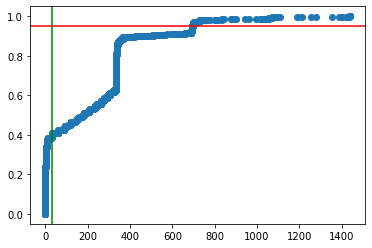

In [319]:
x,y = ecdf(multiple_uris['days_in_charts'])
plt.axhline(y=0.95, color='r', linestyle='-')
plt.axvline(x=31, color='g')
plt.scatter(x=x, y=y);

In [306]:
df_highest_pos[df_highest_pos['uri'].isin(test_taylor)]

,date_highest_rank,position_highest,uri,track,title,artist
231602,2017-04-09,3,https://open.spotify.com/track/7zgqtptzvhf8gemdsm2vp2,"...ready for it? , taylor swift",...ready for it?,taylor swift


In [318]:
df_highest_pos = df_database.loc[df_database.groupby('uri', sort=False)['position'].idxmin()].rename(columns={'date':'date_highest_rank', 'position':'position_highest'})
df_highest_pos.sort_values('track')


,date_highest_rank,position_highest,uri,track,title,artist
90855,2019-09-08,56,https://open.spotify.com/track/5a1oflopian5xxf5ue6472,"! , trippie redd",!,trippie redd
88188,2019-08-23,189,https://open.spotify.com/track/5dkz2drcpjrqwlrqe6q35e,"#proudcatownerremix , xxxtentacion, rico nasty",#proudcatownerremix,"xxxtentacion, rico nasty"
193066,2018-03-16,67,https://open.spotify.com/track/65u1dhqyqye4y4an2edmmf,"$$$ - with matt ox , xxxtentacion",$$$ - with matt ox,xxxtentacion
158523,2018-05-09,124,https://open.spotify.com/track/4xkoasrkexmciuuogzkvts,"'till i collapse , eminem, nate dogg",'till i collapse,"eminem, nate dogg"
224333,2017-11-10,134,https://open.spotify.com/track/6yr8githwvffi4o6q5ebdt,"'till i collapse , eminem, nate dogg",'till i collapse,"eminem, nate dogg"
...,...,...,...,...,...,...
166392,2018-07-28,193,https://open.spotify.com/track/7lehoiftclxy4p7cutkuq8,"zum zum , daddy yankee, r.k.m & ken-y, arcangel",zum zum,"daddy yankee, r.k.m & ken-y, arcangel"
132984,2019-11-01,185,https://open.spotify.com/track/18lxrvm337xqvfxpab9puj,"è sempre bello , coez",è sempre bello,coez
167719,2018-07-21,120,https://open.spotify.com/track/2hl6q70unbvigo3g1r7ufx,"échame la culpa , luis fonsi, demi lovato",échame la culpa,"luis fonsi, demi lovato"
202604,2018-01-27,5,https://open.spotify.com/track/1zsg4eazmka1dvjddsaglk,"échame la culpa , luis fonsi, demi lovato",échame la culpa,"luis fonsi, demi lovato"


In [312]:
df_first_date = df_database.loc[df_database.groupby('uri', sort=False)['date'].idxmin()].rename(columns={'date':'date_first_200', 'position':'position_first'})
df_first_date


,date_first_200,position_first,uri,track,title,artist
802,2020-01-11,3,https://open.spotify.com/track/47eiuvwup4c9fgccapuucs,"dakiti , bad bunny, jhay cortez",dakiti,"bad bunny, jhay cortez"
800,2020-01-11,1,https://open.spotify.com/track/35mvy5s1h3j2qzyna3tfe0,"positions , ariana grande",positions,ariana grande
13002,2020-01-09,3,https://open.spotify.com/track/3tjfyv6rsftuktyl3ztycq,"mood , 24kgoldn",mood,24kgoldn
7002,2020-01-10,3,https://open.spotify.com/track/7hxhwccaiixflczvdgnqhx,"lemonade , internet money",lemonade,internet money
810,2020-01-11,11,https://open.spotify.com/track/4y4spb9m0q6026kfkavy9q,"lonely , justin bieber",lonely,justin bieber
...,...,...,...,...,...,...
280183,2017-01-01,184,https://open.spotify.com/track/7atlmciausqzqixslbbpw6,"bobo , j balvin",bobo,j balvin
280184,2017-01-01,185,https://open.spotify.com/track/2fisth0gypiiougjfzmija,"stay , kygo",stay,kygo
280186,2017-01-01,187,https://open.spotify.com/track/6jyujfedevpmdwqw0pkbgj,"purple lamborghini , skrillex",purple lamborghini,skrillex
280191,2017-01-01,192,https://open.spotify.com/track/1kusepf3aacietutyrw4gv,"paper planes , m.i.a.",paper planes,m.i.a.


In [313]:
df_highest_first200 = df_highest_pos.merge(df_first_date)
df_highest_first200['days_first200_highest'] = (df_highest_first200['date_highest_rank'] - df_highest_first200['date_first_200']).dt.days

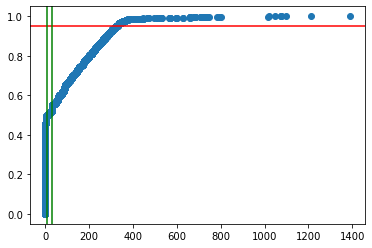

In [314]:
# plot the days between first time in top200 and highesth rank
x,y = ecdf(df_highest_first200['days_first200_highest'])
plt.axhline(y=0.95, color='r', linestyle='-')
plt.axvline(x=7, color='g')
plt.axvline(x=31, color='g')
plt.scatter(x=x, y=y);
# about 50% between 1 week, about 95% in 1 year..

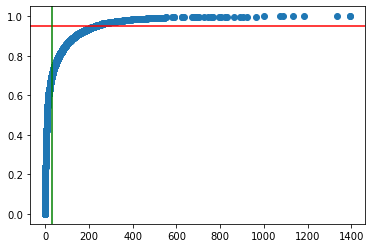

In [315]:
# aantal dagen in top200
ndays = df_database.groupby('uri')['date'].nunique().reset_index().rename(columns={'date':'ndays'})['ndays']

x,y = ecdf(ndays)
plt.axhline(y=0.95, color='r', linestyle='-')
plt.axvline(x=31, color='g')
plt.scatter(x=x, y=y);

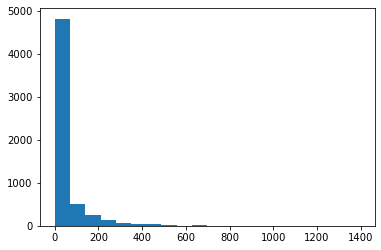

In [316]:
plt.hist(ndays, bins=20);

In [159]:
# FINAL
print('Shape before: ', df_final.shape)

# Make selections
df_final = df_final[df_final['Country'] == 'Global']
df_final = df_final[df_final['Album/Single']=='single']
df_final = df_final[~df_final['Artist'].isna()]

cols_to_keep = ['Artist', 'Title', 'Uri', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acoustics', 'instrumentalness', 'liveliness', 
                'valence', 'tempo', 'duration_ms', 'time_signature', 'Release_date', 'Explicit', 'Artist_followers', 'Popu_max'] # , 'artist_ids'
# cols_to_drop = ['Country', 'Argentina', 'Australia', 'Austria', 'Belgium', 'Brazil', 'Canada','Chile', 'Colombia', 'Costa Rica', 'Denmark', 'Ecuador', 'Finland', 
#                 'France', 'Germany', 'Global', 'Indonesia', 'Ireland', 'Italy', 'Malaysia', 'Mexico', 'Netherlands', 'New Zealand', 'Norway', 'Peru', 
#                 'Philippines', 'Poland', 'Portugal', 'Singapore', 'Spain', 'Sweden', 'Switzerland', 'Taiwan', 'Turkey', 'UK', 'USA']
# df_final = df_final.drop(columns=cols_to_drop, axis=1)
df_final = df_final[cols_to_keep]
# To do: filter on <1 month until highest position

# Preprocess columns
for col in ["Uri", "Title", "Artist"]:
    df_final[col] = remove_left_right_spaces(df_final, col)
    df_final[col] = df_final[col].str.lower()
df_final['track'] = df_final['Title'] + ' , ' + df_final['Artist']

# Change data types
df_final['Release_date'] = pd.to_datetime(df_final['Release_date'])
for col in ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acoustics', 'instrumentalness', 'liveliness', 'valence', 'tempo',
       'duration_ms', 'time_signature', 'Explicit', 'Artist_followers','Popu_max']:
       df_final[col] = df_final[col].astype(float)

print('Shape after: ', df_final.shape)
print('# titles: ', df_final.Title.nunique())
print('# artists: ', df_final.Artist.nunique())

Shape before:  (170633, 151)
Shape after:  (2116, 21)
# titles:  2033
# artists:  1515


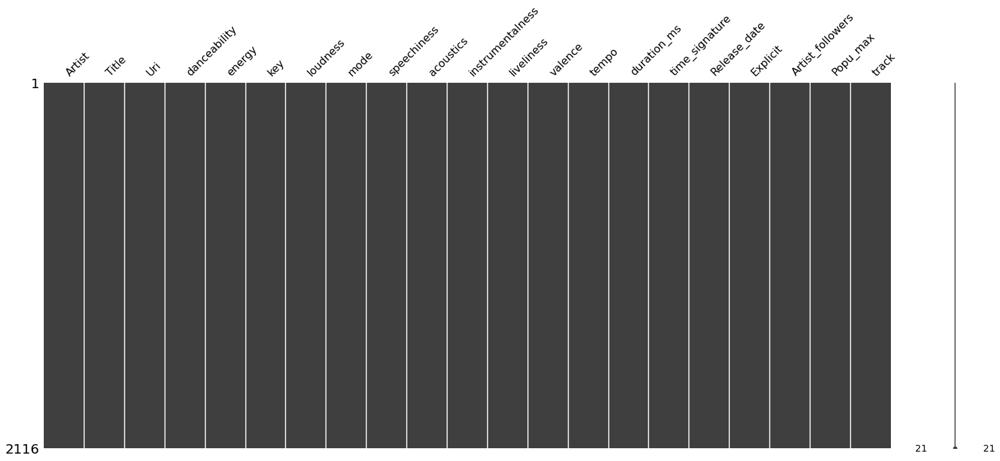

In [320]:
msnos.matrix(df_final);

In [176]:
df_final.head()

,Artist,Title,Uri,danceability,energy,key,loudness,mode,speechiness,acoustics,instrumentalness,liveliness,valence,tempo,duration_ms,time_signature,Release_date,Explicit,Artist_followers,Popu_max,track
0,paulo londra,adan y eva,https://open.spotify.com/track/6fyrxc8tjuh863jckywqtk,0.767,0.709,1.0,-4.470,1.0,0.336,0.323,0.0,0.0676,0.720,171.993,258639.0,4.0,2018-11-05,0.0,11427104.0,10.0,"adan y eva , paulo londra"
39,kesha,hymn,https://open.spotify.com/track/0wjjhrgdhht93z3iwdmb0t,0.488,0.538,6.0,-4.974,1.0,0.076,0.147,0.0,0.3050,0.380,67.037,205600.0,4.0,2017-08-03,1.0,5910376.0,131.0,"hymn , kesha"
147,wos,canguro,https://open.spotify.com/track/4wynkaze82bnlp2lhir1fx,0.602,0.751,1.0,-4.358,1.0,0.327,0.173,0.0,0.6670,0.934,163.874,196745.0,4.0,2019-08-09,1.0,1559159.0,134.0,"canguro , wos"
156,ellie goulding,sixteen,https://open.spotify.com/track/4pkidtpgedm0enzdvillnd,0.669,0.801,8.0,-5.445,1.0,0.136,0.268,0.0,0.0594,0.541,109.919,201072.0,4.0,2019-04-12,0.0,8604850.0,59.0,"sixteen , ellie goulding"
193,famous dex,japan,https://open.spotify.com/track/4ltiud1dwbko4l7wqmkd7c,0.733,0.678,6.0,-7.771,1.0,0.439,0.121,0.0,0.3450,0.841,175.984,144149.0,4.0,2018-03-16,1.0,2039736.0,64.0,"japan , famous dex"


# Explore data

In [160]:
profile_df_database = ProfileReport(df_database, title="Pandas Profiling Report", explorative=True)
profile_df_database

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


In [161]:
profile_df_database.to_file("df_database.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 183.52it/s]


In [162]:
profile_df_final = ProfileReport(df_final, title="Pandas Profiling Report", explorative=True)
profile_df_final

Render HTML: 100%|██████████| 1/1 [00:09<00:00,  9.85s/it]


In [163]:
profile_df_final.to_file("df_final.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 41.00it/s]


# Inconsistencies in highest rank

In [164]:
# we can see that multiple some were released multiple times and hence have multiple highest positions..
# show that multiple songs have multiple uri's with different positions
test = df_database.groupby(['title','uri'])['position'].min().reset_index()
test[:30]

,title,uri,position
0,!,https://open.spotify.com/track/5a1oflopian5xxf5ue6472,56
1,#proudcatownerremix,https://open.spotify.com/track/5dkz2drcpjrqwlrqe6q35e,189
2,$$$ - with matt ox,https://open.spotify.com/track/65u1dhqyqye4y4an2edmmf,67
3,'till i collapse,https://open.spotify.com/track/4xkoasrkexmciuuogzkvts,124
4,'till i collapse,https://open.spotify.com/track/6yr8githwvffi4o6q5ebdt,134
5,+linda,https://open.spotify.com/track/5cbrohkdyijf9bpguhkkg0,156
6,...ready for it?,https://open.spotify.com/track/19wjvvgxjdkxflxoadpwtm,10
7,...ready for it?,https://open.spotify.com/track/2yla0quldqr0qaivvwn6b5,90
8,...ready for it?,https://open.spotify.com/track/4vvb2d6ryl669h7tlyokwx,88
9,...ready for it?,https://open.spotify.com/track/7zgqtptzvhf8gemdsm2vp2,3


In [321]:
# op basis van uri
df_highest_first = df_highest_first200.merge(df_final[['Uri', 'Title', 'Artist', 'track', 'Popu_max', 'Release_date']], left_on='uri', right_on='Uri')
sum(df_highest_first['position_highest'] != df_highest_first['Popu_max'])

0

In [325]:
# op basis van track
df_highest_first_track = df_highest_first200.merge(df_final[['Uri', 'Title', 'Artist', 'track', 'Popu_max', 'Release_date']], left_on='track', right_on='track')
print(df_highest_first_track.shape)
sum(df_highest_first_track['position_highest'] !=  df_highest_first_track['Popu_max']) / len(df_highest_first_track)

(1336, 14)


0.30164670658682635

In [326]:
uri_database = set(df_database['uri'])
uri_final = set(df_final['Uri'])
overlap = list(uri_database & uri_final)
print('length of database is: ', len(uri_database))
print('length of final database is: ', len(uri_final))
print('length of overlap is: ', len(overlap))

length of database is:  5910
length of final database is:  2116
length of overlap is:  2116


In [327]:
df_highest_first['days_to_highest_rank'] = (df_highest_first['date_highest_rank'] - df_highest_first['Release_date']).dt.days

In [336]:
len(df_highest_first[df_highest_first['days_to_highest_rank']<=31]) / len(df_highest_first)

0.5949905482041588

In [333]:
df_highest_first['days_to_highest_rank'].describe()

count     2116.000000
mean       137.469754
std       1131.650274
min       -323.000000
25%          0.000000
50%          7.500000
75%         83.250000
max      27752.000000
Name: days_to_highest_rank, dtype: float64

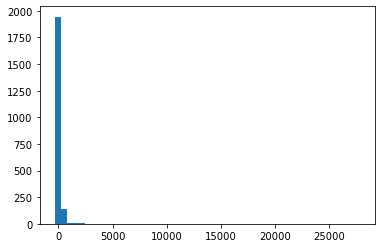

In [334]:
plt.hist(df_highest_first['days_to_highest_rank'], bins=50)
plt.show()

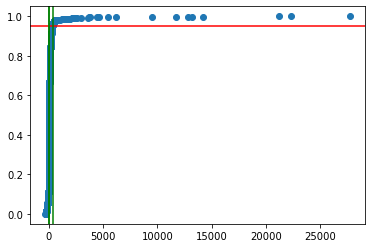

In [330]:
# plot the days between first time in top200 and highesth rank
x,y = ecdf(df_highest_first['days_to_highest_rank'])
plt.axhline(y=0.95, color='r', linestyle='-')
plt.axvline(x=7, color='g')
plt.axvline(x=31, color='g')
plt.axvline(x=365, color='g')
plt.scatter(x=x, y=y);
# about 50% between 1 week, about 95% in 1 year..

# Model

In [206]:
import seaborn as sns
from scipy.stats import norm


/Users/karlijnschipper/opt/anaconda3/envs/spotifAI/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Popu_max', ylabel='Density'>

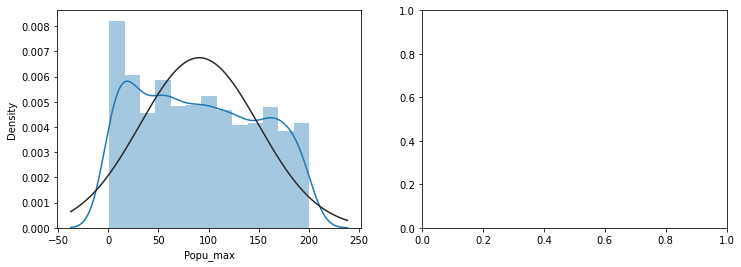

In [337]:
fig, ax = plt.subplots(1,2)
width, height = fig.get_size_inches()
fig.set_size_inches(width*2, height)
sns.distplot(df_final['Popu_max'], ax=ax[0], fit=norm)

In [171]:
df_model = df_final.drop(['Artist','Title','Release_date'], axis=1).set_index('Uri') #,'track'

In [172]:
df_model.describe()

,danceability,energy,key,loudness,mode,speechiness,acoustics,instrumentalness,liveliness,valence,tempo,duration_ms,time_signature,Explicit,Artist_followers,Popu_max
count,2116.000000,2116.000000,2116.000000,2116.000000,2116.000000,2116.000000,2116.000000,2116.000000,2116.000000,2116.000000,2116.000000,2116.000000,2116.000000,2116.000000,2.116000e+03,2116.000000
mean,0.694748,0.663540,5.265595,-5.852483,0.559546,0.127156,0.197813,0.009496,0.175909,0.501204,121.927647,201198.803875,3.973062,0.377127,8.632365e+06,90.661626
std,0.135931,0.152084,3.648034,2.144173,0.496559,0.108565,0.215225,0.063992,0.135447,0.217528,29.412171,42732.694905,0.283064,0.484782,1.094915e+07,59.123366
min,0.156000,0.095900,0.000000,-18.717000,0.000000,0.023900,0.000002,0.000000,0.019700,0.036300,46.489000,78681.000000,1.000000,0.000000,1.720000e+02,1.000000
25%,0.614000,0.572000,1.000000,-6.977500,0.000000,0.048175,0.037450,0.000000,0.094375,0.329750,98.049250,176278.750000,4.000000,0.000000,1.371556e+06,38.000000
50%,0.711500,0.675000,5.000000,-5.581500,1.000000,0.080900,0.121000,0.000000,0.122000,0.503000,119.488500,197456.000000,4.000000,0.000000,4.501456e+06,87.500000
75%,0.792000,0.775000,8.000000,-4.425750,1.000000,0.173250,0.275000,0.000030,0.215250,0.669250,141.983500,221326.750000,4.000000,1.000000,1.262215e+07,141.000000
max,0.970000,0.990000,11.000000,1.509000,1.000000,0.765000,0.984000,0.915000,0.988000,0.968000,216.334000,851871.000000,5.000000,1.000000,7.178310e+07,200.000000


In [173]:
corr = df_model.corr()
corr[['Popu_max']].sort_values(by='Popu_max')

,Popu_max
Artist_followers,-0.287403
duration_ms,-0.056750
acoustics,-0.025466
danceability,-0.011733
key,-0.006833
instrumentalness,0.004027
time_signature,0.009343
liveliness,0.015329
tempo,0.021855
loudness,0.021995


<AxesSubplot:>

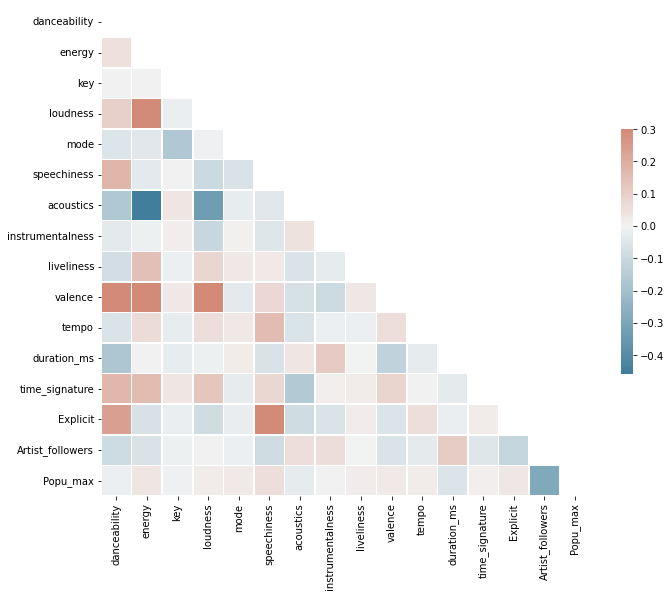

In [294]:
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [174]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2116 entries, https://open.spotify.com/track/6fyrxc8tjuh863jckywqtk to https://open.spotify.com/track/1xndod8crer5ctkov5g1ln
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   danceability      2116 non-null   float64
 1   energy            2116 non-null   float64
 2   key               2116 non-null   float64
 3   loudness          2116 non-null   float64
 4   mode              2116 non-null   float64
 5   speechiness       2116 non-null   float64
 6   acoustics         2116 non-null   float64
 7   instrumentalness  2116 non-null   float64
 8   liveliness        2116 non-null   float64
 9   valence           2116 non-null   float64
 10  tempo             2116 non-null   float64
 11  duration_ms       2116 non-null   float64
 12  time_signature    2116 non-null   float64
 13  Explicit          2116 non-null   float64
 14  Artist_followers  2116 non-null   float6

In [179]:
from sklearn.model_selection import train_test_split

X = df_model.drop(['Popu_max', 'track'], axis=1).set_index('Uri')
y = df_model['Popu_max']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [181]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled = scaler.fit_transform(X_train)
x_test = scaler.transform(X_test)

In [223]:
# baseline model
import random
y_pred = pd.Series([random.randint(0,22) for i in range(len(y_train))])
# training model
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_train) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_train), 5))

# test
y_pred = pd.Series([random.randint(0,22) for i in range(len(y_test))])
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_test) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_test), 5))

The rmse of prediction is: 99.49904
The mse of prediction is: 9900.05942
The rmse of prediction is: 99.35051
The mse of prediction is: 9870.52441


In [225]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(X_train, y_train)
print(reg.score(X_train, y_train))

from sklearn.metrics import mean_squared_error

y_pred = reg.predict(X_train)
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_train) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_train), 5))

reg.coef_
reg.intercept_
y_pred = reg.predict(X_test)
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_test) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_test), 5))

0.0722300295778836
The rmse of prediction is: 56.94821
The mse of prediction is: 3243.09909
The rmse of prediction is: 55.43921
The mse of prediction is: 3073.50583


In [226]:
from sklearn.linear_model import Ridge
clf = Ridge(alpha=1.0)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_train)
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_train) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_train), 5))


y_pred = clf.predict(X_test)
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_test) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_test), 5))


The rmse of prediction is: 56.9491
The mse of prediction is: 3243.20004
0.0722192566396972
The rmse of prediction is: 55.45564
The mse of prediction is: 3075.32812


/Users/karlijnschipper/opt/anaconda3/envs/spotifAI/lib/python3.6/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.22729e-17): result may not be accurate.
  overwrite_a=True).T


In [232]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators = 1000, random_state = 42)

from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt', 2, 3]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(40, 110, num = 8)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4, 5]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [235]:
y_pred = rf_random.predict(X_train)
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_train) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_train), 5))


y_pred = rf_random.predict(X_test)
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_test) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_test), 5))

# # Get numerical feature importances
# importances = list(rf_random.feature_importances_)
# feature_list = X_train.columns
# # List of tuples with variable and importance
# feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]
# # Sort the feature importances by most important first
# feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# # Print out the feature and importances 
# [print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances]

print(rf_random.best_params_)


The rmse of prediction is: 42.98424
The mse of prediction is: 1847.64516
The rmse of prediction is: 54.95816
The mse of prediction is: 3020.39982
{'n_estimators': 1000, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': True}


In [237]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

grid_search.fit(X_train, y_train)
print(grid_search.best_params_)

    
best_grid = grid_search.best_estimator_

y_pred = best_grid.predict(X_train)
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_train) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_train), 5))


y_pred = best_grid.predict(X_test)
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_test) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_test), 5))

Fitting 3 folds for each of 288 candidates, totalling 864 fits
{'bootstrap': True, 'max_depth': 80, 'max_features': 3, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}
The rmse of prediction is: 38.69003
The mse of prediction is: 1496.91814
The rmse of prediction is: 55.2973
The mse of prediction is: 3057.79137


In [229]:
# conda install -c conda-forge lightgbm   
import lightgbm as lgb
hyper_params = {
    'task': 'train',
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': ['l1','l2'],
    'learning_rate': 0.005,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.7,
    'bagging_freq': 10,
    'verbose': 0,
    "max_depth": 8,
    "num_leaves": 128,  
    "max_bin": 512,
    "num_iterations": 100000
}
gbm = lgb.LGBMRegressor(**hyper_params)

gbm.fit(X_train, y_train, eval_set=[(X_test, y_test)], eval_metric='l1', early_stopping_rounds=1000)

y_pred = gbm.predict(X_train)
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_train) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_train), 5))


y_pred = gbm.predict(X_test)
print('The rmse of prediction is:', round(mean_squared_error(abs(y_pred), y_test) ** 0.5, 5))
print('The mse of prediction is:', round(mean_squared_error(abs(y_pred), y_test), 5))


/Users/karlijnschipper/opt/anaconda3/envs/spotifAI/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] fe

In [300]:
from sklearn.neighbors import KNeighborsRegressor

#KNN
knn_model = KNeighborsRegressor()
param_grid = {'n_neighbors':np.arange(5, 200, 5)}
gsModelTrain = GridSearchCV(estimator = knn_model, param_grid = param_grid, cv=2)
gsModelTrain.fit(X_train, y_train)
knn_model.set_params(**gsModelTrain.best_params_)
#fit to train data
knn_model.fit(X_train, y_train)
#Get scores comparing real house prices and predicted house prices from the test dataset.
print("r2 Test score:", r2_score(y_test, knn_model.predict(X_test)))
print("r2 Train score:", r2_score(y_train, knn_model.predict(X_train)))
trainRMSE = np.sqrt(mean_squared_error(y_true=y_train, y_pred=knn_model.predict(X_train)))
testRMSE = np.sqrt(mean_squared_error(y_true=y_test, y_pred=knn_model.predict(X_test)))
print("Train RMSE:", trainRMSE)
print("Test RMSE:", testRMSE)

r2 Test score: 0.1183166795277274
r2 Train score: 0.09657033489860278
Train RMSE: 56.199468173131564
Test RMSE: 55.4639363097421


In [ ]:
rfModel.feature_importances_
feature_importances = pd.DataFrame(rfModel.feature_importances_,
index = featuresDummiesTrain.columns,
columns=['importance']).sort_values('importance',ascending=False)
pd.set_option("display.max_rows",None,"display.max_columns",None)
print(feature_importances)
feature_importances.index[:10]

In [380]:
# random getal
# # calculate MSE
# XGBoost
# compare output
# feature importance / SHAP
# save model